In [ ]:
!pip install pywph

In [ ]:
!pip install torch

In [ ]:
!git clone https://github.com/jfrob27/pywavan.git

Cloning into 'pywavan'...
remote: Enumerating objects: 524, done.
remote: Counting objects: 100% (54/54), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 524 (delta 29), reused 34 (delta 16), pack-reused 470 (from 1)
Receiving objects: 100% (524/524), 7.05 MiB | 11.58 MiB/s, done.
Resolving deltas: 100% (292/292), done.


In [ ]:
!pip install pywavan/

Processing ./pywavan
  Preparing metadata (setup.py) ... done
  Created wheel for pywavan: filename=pywavan-0.1-py3-none-any.whl size=21502 sha256=c225a95d898f60c815e175b96d1117ee1a32d3b1c6e1bd3b849c7253113dceba
  Stored in directory: /tmp/pip-ephem-wheel-cache-re1ewy1w/wheels/c3/df/5a/a38957d32f204fadb637d615d544c92413636899b77433d834
Successfully built pywavan


In [ ]:
!pip uninstall pywavan

In [ ]:
!git clone https://github.com/constantauclair/CompSep.git

Cloning into 'CompSep'...
remote: Enumerating objects: 218, done.
remote: Counting objects: 100% (122/122), done.
remote: Compressing objects: 100% (103/103), done.
remote: Total 218 (delta 33), reused 36 (delta 12), pack-reused 96 (from 1)
Receiving objects: 100% (218/218), 63.17 MiB | 27.55 MiB/s, done.
Resolving deltas: 100% (79/79), done.


# generating ISM

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.11/dist-packages/IPython/core/magics/pylab.py:159: UserWarning: pylab import has clobbered these variables: ['gamma']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


<Figure size 640x480 with 0 Axes>

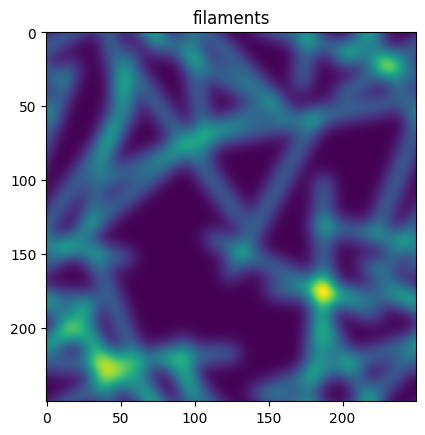

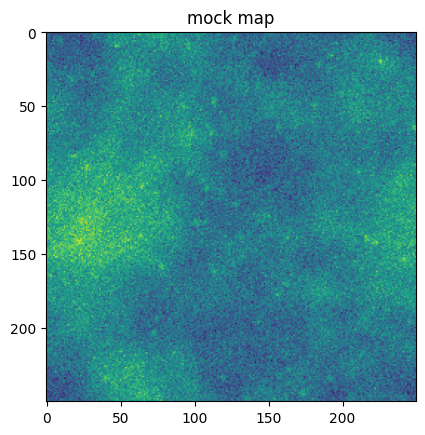

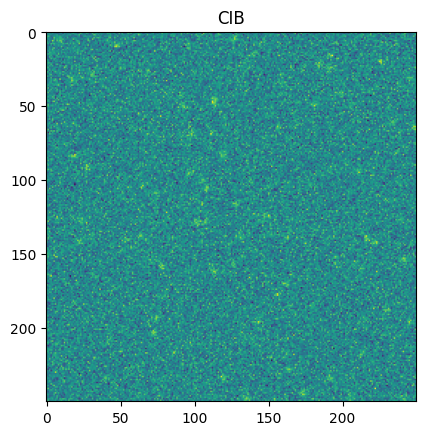

<Figure size 640x480 with 0 Axes>

In [ ]:
%pylab inline
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
from pywavan import fbm2d
from scipy.ndimage import rotate
from pywavan import imsmooth
from pywavan import fan_trans
import numpy as np
import pywph as pw
import torch

nx = 250
ny = 250

gamma = -3.6
fbm = fbm2d(gamma, ny,nx)

#Display the map
#figure(figsize=(12,12))
#imshow(fbm)
#Filament size and initial position
fsz = 128 #filament length (in px)
pos = np.array([ny/2-1,nx/2-1], dtype=int) #center of the image

#Number of orientations and filaments
N=25 #no. of filaments to generate
delt=180/N #angular spacing in filaments, semicircle divided by no. of filaments

#Random shift for the different filaments
shx = np.random.randn(N)*250. #random shift of the filaments from random dist, scaled by 250
shy = np.random.randn(N)*250.

#Filaments layer
imfiltot = np.zeros((ny,nx)) #store all the filament images

#Loop to create all filaments
for i in range(N):
    imfil = imfiltot * 0.
    # Replace np.int with int here
    imfil[np.int64(pos[0]-fsz/2):np.int64(pos[0]+fsz/2)-1,pos[1]] = 1.
    angl = delt*i
    imfil = rotate(imfil,angl,reshape=False)
    # Replace np.int with int here as well
    imfil = np.roll(imfil,np.int64(shx[i]),axis=1)
    imfil = np.roll(imfil,np.int64(shy[i]),axis=0)
    #imshow(imfil)
    imfiltot += imfil #add to the current filament

#Impose filaments width
FWHM = 15
imfiltot = imsmooth(imfiltot,FWHM)
imshow(imfiltot)
plt.title("filaments")
figure()
#Create image total
imtot = fbm + imfiltot * 10. # Assuming 'fbm' is defined elsewhere in your code.
#Display the filament layer
#imshow(imtot)

n = np.random.normal(0,np.std(imtot),size=np.shape(imtot)).astype(np.float64)
d = imtot + n#adding gaussian noise to signal


# adding point sources

num_sources = 70  # Number of point sources to add
source_intensity = 30   # Intensity of the point sources
source_fwhm = 8  # Full width at half maximum for Gaussian smoothing of sources


x_coords = np.random.randint(0, nx, num_sources)
y_coords = np.random.randint(0, ny, num_sources)


point_sources = np.zeros_like(d)
for x, y in zip(x_coords, y_coords):
    point_sources[y, x] = source_intensity

#Smooth point sources
point_sources = gaussian_filter(point_sources,sigma=source_fwhm/5.5)
imtot2 = imtot + point_sources

#imshow(imtot2)
plt.title("filaments+point sources")
#figure()
d += point_sources

imshow(d)
plt.title("mock map")
figure()

c = n+point_sources
#c=n
imshow(c)
plt.title("CIB")
figure()

  0%|          | 0/19 [00:00<?, ?it/s]

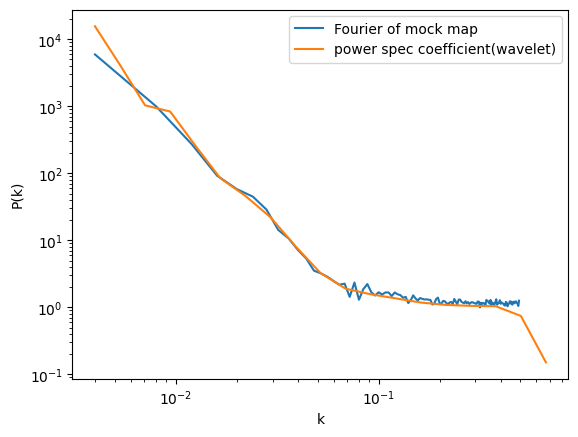

In [ ]:
#Calculate the total image Fourier power spectrum
from pywavan import powspec
#print((d))
tab_k, spec_ktot = powspec(d, reso=1)

from pywavan import fan_trans
#Calculate the Fan wavelet transforms
wt, S11a, wav_k, S1a, q = fan_trans(d, reso=1, q=0, qdyn=False)
plt.plot(tab_k, spec_ktot, label="Fourier of mock map")
plt.plot(wav_k, S1a, label="power spec coefficient(wavelet)")
plt.xscale("log")
plt.yscale("log")
plt.xlabel('k')
plt.ylabel('P(k)')
plt.legend()
plt.show()



---



##component separation in the simulated mock map

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import time
import numpy as np
import torch
import scipy
import scipy.optimize as opt
import matplotlib.pyplot as plt
import pywph as pw
import os
cwd = os.getcwd()
import sys
sys.path.append(cwd)
from CompSep.Library.comp_sep_functions import create_batch, compute_bias_std, compute_mask, compute_loss_BR, compute_loss_JMD
from CompSep.Library.tools import plot, powspec, plot_PS, plot_wph

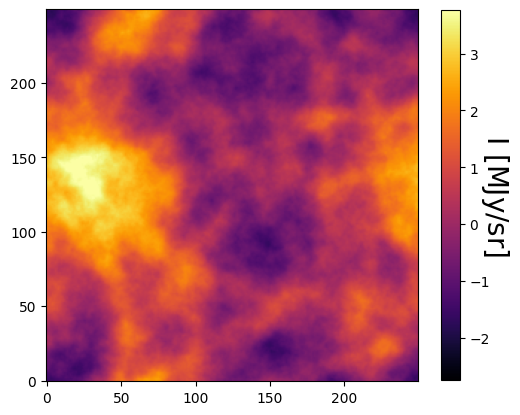

In [ ]:
plot(imtot)#S map


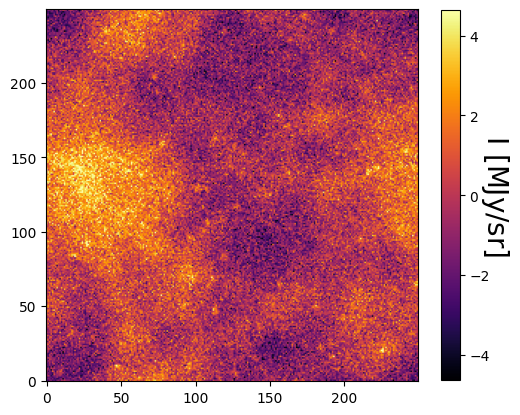

In [ ]:
plot(d)#mock map

In [ ]:
import numpy as np
np.save('d.npy', d)

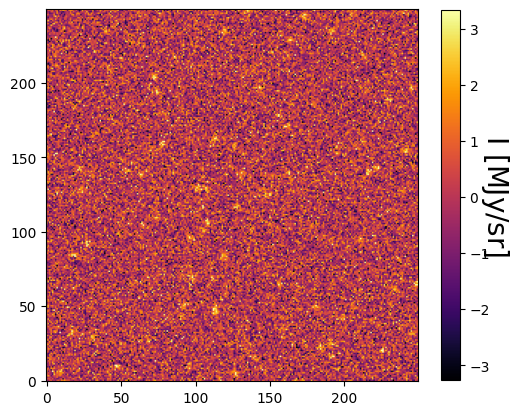

In [ ]:
plot(c)#contamination CIB

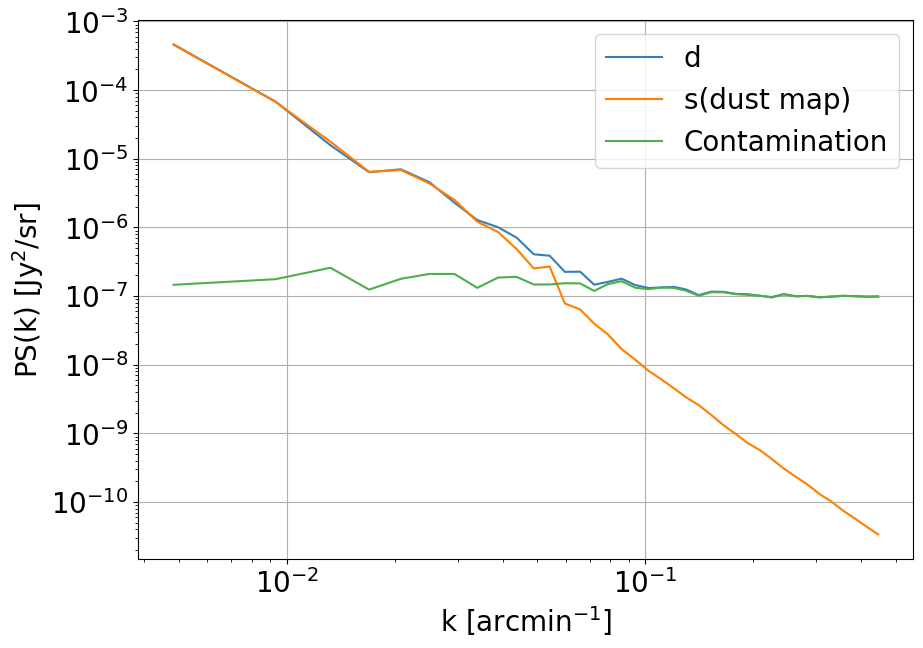

In [ ]:
plot_PS(np.array([d,imtot,c]),labels=['d','s(dust map)','Contamination']) #compare the power spectra of d, s, c

In [ ]:
Mn = 60 #noise realization
noise = np.random.normal(0,np.std(imtot),size=(Mn,np.shape(imtot)[0],np.shape(imtot)[0])).astype(np.float64)

num_sources = 70
source_intensity = 30
source_fwhm = 8

x_coords = np.random.randint(0, np.shape(imtot)[1], size=(Mn, num_sources))
y_coords = np.random.randint(0, np.shape(imtot)[0], size=(Mn, num_sources))

for i in range(Mn):
    point_sources_map = np.zeros_like(noise[i])
    for x, y in zip(x_coords[i], y_coords[i]):
        point_sources_map[y, x] = source_intensity
    point_sources_map = gaussian_filter(point_sources_map, sigma=source_fwhm/5.5)
    noise[i] += point_sources_map

In [ ]:
N, N = np.shape(imtot) # map size
J = int(np.log2(N))-2 # number of scales
L = 4 # number of angles
pbc = True # periodic boundary conditions
dn = 5 # number of translations
wph_model = ["S11","S00","S01","Cphase","C01","C00","L"] # list of WPH coefficients

In [ ]:
style = 'BR'
method = 'L-BFGS-B'
n_epoch = 5
n_iter = 50
device = 0
batch_size = 5

In [ ]:
#alternative approach for minimalization
styles = ['JMD', 'BR']
method = 'L-BFGS-B'
n_epoch = 4
n_iter = 50
device = 0
batch_size = 5

In [ ]:
batch_number = int(Mn/batch_size)
n_batch = create_batch(noise, device, batch_number, batch_size, N)
wph_op = pw.WPHOp(N, N, J, L=L, dn=dn, device=device)

#computing loss function and gradient

In [ ]:
def objective(x):
    """
    Computes the loss and the corresponding gradient.

    Parameters
    ----------
    x : torch 1D tensor
        Flattened running map.

    Returns
    -------
    float
        Loss value.
    torch 1D tensor
        Gradient of the loss.

    """
    global eval_cnt
    global loss_list
    start_time = time.time()
    u = x.reshape((N, N)) # Reshape x
    u = torch.from_numpy(u).to(device).requires_grad_(True) # Track operations on u
    if style == 'BR':
        L = compute_loss_BR(u, coeffs_target, std, mask, device, Mn, wph_op, noise, pbc) # Compute the loss 'à la Bruno'
    if style == 'JMD':
        L = compute_loss_JMD(u, coeffs_target, std, mask, device, wph_op, pbc) # Compute the loss 'à la Jean-Marc'
    u_grad = u.grad.cpu().numpy().astype(x.dtype) # Compute the gradient
    if eval_cnt % 5 == 0:
        print(f"Evaluation: {eval_cnt}")
        print("L = "+str(round(L.item(),5)))
        print("(computed in "+str(round(time.time() - start_time,3))+"s)")
        print("")
    eval_cnt += 1
    loss_list.append(L.item())
    return L.item(), u_grad.ravel()

#only power spectrum term(S11 coefficient)

Starting epoch 1...
Computing loss arguments...
Real mask computed : 100 % of coeffs kept !
Imaginary mask computed : 95 % of coeffs kept !
Loss arguments computed !
Beginning optimization...
Evaluation: 0
L = 111.47569
(computed in 3.003s)

Evaluation: 5
L = 14.72125
(computed in 2.625s)

Evaluation: 10
L = 0.83955
(computed in 2.629s)

Evaluation: 15
L = 0.80267
(computed in 2.636s)

Evaluation: 20
L = 0.46947
(computed in 2.677s)

Evaluation: 25
L = 0.39524
(computed in 2.635s)

Evaluation: 30
L = 0.33069
(computed in 2.625s)

Evaluation: 35
L = 0.30855
(computed in 2.691s)

Evaluation: 40
L = 0.29288
(computed in 2.735s)

Evaluation: 45
L = 0.27824
(computed in 2.645s)

Evaluation: 50
L = 0.26516
(computed in 2.621s)

Evaluation: 55
L = 0.25347
(computed in 2.565s)

Epoch 1 done !


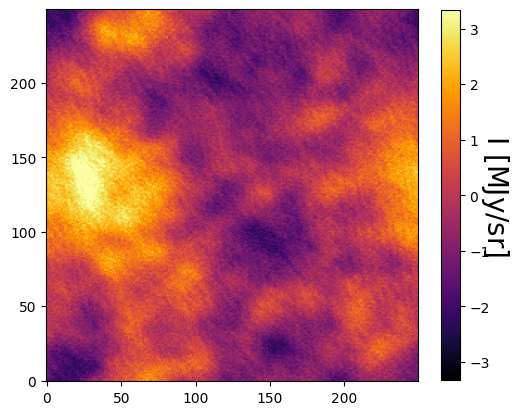

Starting epoch 2...
Computing loss arguments...
Real mask computed : 100 % of coeffs kept !
Imaginary mask computed : 95 % of coeffs kept !
Loss arguments computed !
Beginning optimization...
Evaluation: 60
L = 1.70388
(computed in 2.427s)

Evaluation: 65
L = 1.62024
(computed in 2.433s)

Evaluation: 70
L = 1.55159
(computed in 2.426s)

Evaluation: 75
L = 1.51194
(computed in 2.41s)

Evaluation: 80
L = 1.49173
(computed in 2.311s)

Evaluation: 85
L = 1.46991
(computed in 2.307s)

Evaluation: 90
L = 1.45251
(computed in 2.314s)

Evaluation: 95
L = 1.43835
(computed in 2.304s)

Evaluation: 100
L = 1.42619
(computed in 2.325s)

Evaluation: 105
L = 1.4141
(computed in 2.32s)

Epoch 2 done !


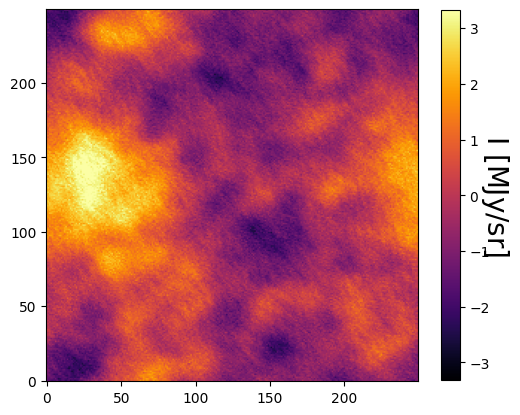

Starting epoch 3...
Computing loss arguments...
Real mask computed : 100 % of coeffs kept !
Imaginary mask computed : 95 % of coeffs kept !
Loss arguments computed !
Beginning optimization...
Evaluation: 110
L = 1.73823
(computed in 2.347s)

Evaluation: 115
L = 1.68041
(computed in 2.375s)

Evaluation: 120
L = 1.64397
(computed in 2.345s)

Evaluation: 125
L = 1.61096
(computed in 2.342s)

Evaluation: 130
L = 1.59033
(computed in 2.354s)

Evaluation: 135
L = 1.57873
(computed in 2.354s)

Evaluation: 140
L = 1.57415
(computed in 2.332s)

Evaluation: 145
L = 1.57
(computed in 2.344s)

Evaluation: 150
L = 1.56494
(computed in 2.349s)

Evaluation: 155
L = 1.55855
(computed in 2.368s)

Evaluation: 160
L = 1.55318
(computed in 2.364s)

Epoch 3 done !


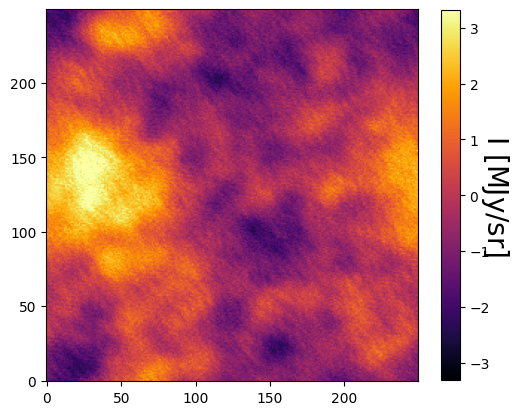

Starting epoch 4...
Computing loss arguments...
Real mask computed : 100 % of coeffs kept !
Imaginary mask computed : 95 % of coeffs kept !
Loss arguments computed !
Beginning optimization...
Evaluation: 165
L = 1.6721
(computed in 2.325s)

Evaluation: 170
L = 1.65497
(computed in 2.353s)

Evaluation: 175
L = 1.63909
(computed in 2.349s)

Evaluation: 180
L = 1.62929
(computed in 2.338s)

Evaluation: 185
L = 1.62221
(computed in 2.351s)

Evaluation: 190
L = 1.61905
(computed in 2.327s)

Evaluation: 195
L = 1.61761
(computed in 2.317s)

Evaluation: 200
L = 1.6151
(computed in 2.305s)

Evaluation: 205
L = 1.61145
(computed in 2.316s)

Evaluation: 210
L = 1.60744
(computed in 2.331s)

Evaluation: 215
L = 1.60508
(computed in 2.316s)

Epoch 4 done !


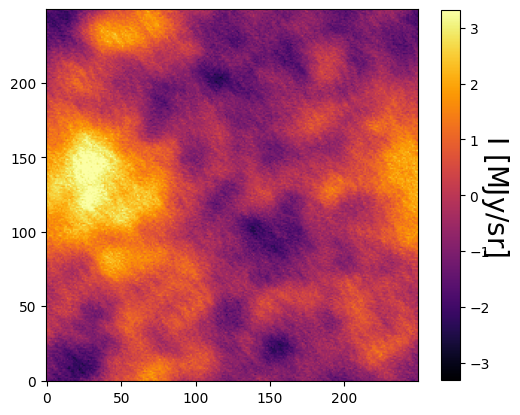

Starting epoch 5...
Computing loss arguments...
Real mask computed : 100 % of coeffs kept !
Imaginary mask computed : 95 % of coeffs kept !
Loss arguments computed !
Beginning optimization...
Evaluation: 220
L = 1.65173
(computed in 2.29s)

Evaluation: 225
L = 1.64883
(computed in 2.3s)

Evaluation: 230
L = 1.63772
(computed in 2.313s)

Evaluation: 235
L = 1.63428
(computed in 2.34s)

Evaluation: 240
L = 1.63088
(computed in 2.345s)

Evaluation: 245
L = 1.62909
(computed in 2.314s)

Evaluation: 250
L = 1.62741
(computed in 2.307s)

Evaluation: 255
L = 1.62632
(computed in 2.313s)

Evaluation: 260
L = 1.62544
(computed in 2.34s)

Evaluation: 265
L = 1.62407
(computed in 2.318s)

Evaluation: 270
L = 1.62295
(computed in 2.29s)

Epoch 5 done !


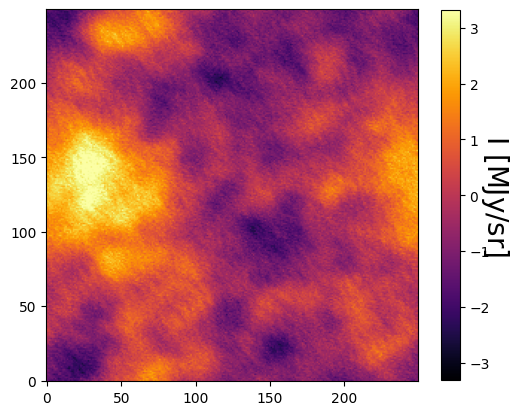

In [ ]:
# Initialization of evaluation count.(L-BFGS-B method)
eval_cnt = 0
# Initialization of the running map s_tilde0.
s_tilde0 = d
# Creation of the loss list.
loss_list = []
# WPH model loading (only the power-spectrum-like coefficients in the first step).
wph_op.load_model(["S11"])
# Loop of the epochs.
for i in range(n_epoch):
    print("Starting epoch "+str(i+1)+"...")
    # Bring s_tilde0 from array to tensor.
    s_tilde0 = torch.from_numpy(s_tilde0).to(device)
    print('Computing loss arguments...')
    # Computation of the noise-induced bias and std on the s_tilde0 map.
    # The bias is only used for style='JMD', but is computed
    # in both cases (no significant additional calculations).
    bias, std = compute_bias_std(s_tilde0, n_batch, wph_op, pbc, Mn, batch_number, batch_size, device)
    # Computation of the WPH statistics of "d".
    coeffs = wph_op.apply(torch.from_numpy(d).to(device), norm=None, pbc=pbc)
    if style == 'BR':
        # In BR's formalism, the target WPH coefficients are the ones of "d".
        # They are split into real and imaginary parts.
        coeffs_target = torch.cat((torch.unsqueeze(torch.real(coeffs),dim=0),
                                   torch.unsqueeze(torch.imag(coeffs),dim=0)))
    if style == 'JMD':
        # In JMD's formalism, the target WPH coefficients are computed as
        # the ones of "d" corrected from the bias estimated before.
        # They are here also split into real and imaginary parts.
        coeffs_target = torch.cat((torch.unsqueeze(torch.real(coeffs)-bias[0],dim=0),
                                   torch.unsqueeze(torch.imag(coeffs)-bias[1],dim=0)))
    # Computation of the mask for the WPH statistics threshold.
    mask = compute_mask(1, s_tilde0, std, wph_op, wph_model, pbc, device)
    print('Loss arguments computed !')
    print('Beginning optimization...')
    # Beginning of the optimization.
    result = opt.minimize(objective, s_tilde0.cpu().ravel(), method=method, jac=True, tol=None,
                          options={"maxiter": n_iter, "gtol": 1e-14, "ftol": 1e-14, "maxcor": 20})
    final_loss, s_tilde0, niter, msg = result['fun'], result['x'], result['nit'], result['message']
    # Reshaping of the running map s_tilde0.
    s_tilde0 = s_tilde0.reshape((N, N)).astype(np.float64)
    print("Epoch "+str(i+1)+" done !")
    plot(s_tilde0)
    # plot_PS(
    #     np.array([d,imtot,s_tilde0]),
    #     labels=['d', 's', 's_tilde0 (Epoch ' + str(i + 1) + ')'],
    #     colors=['blue','orange','black'],
    #     styles=['-','-','--']
    #     )




In [ ]:
np.save('separated_component_stilde0.npy', s_tilde0)

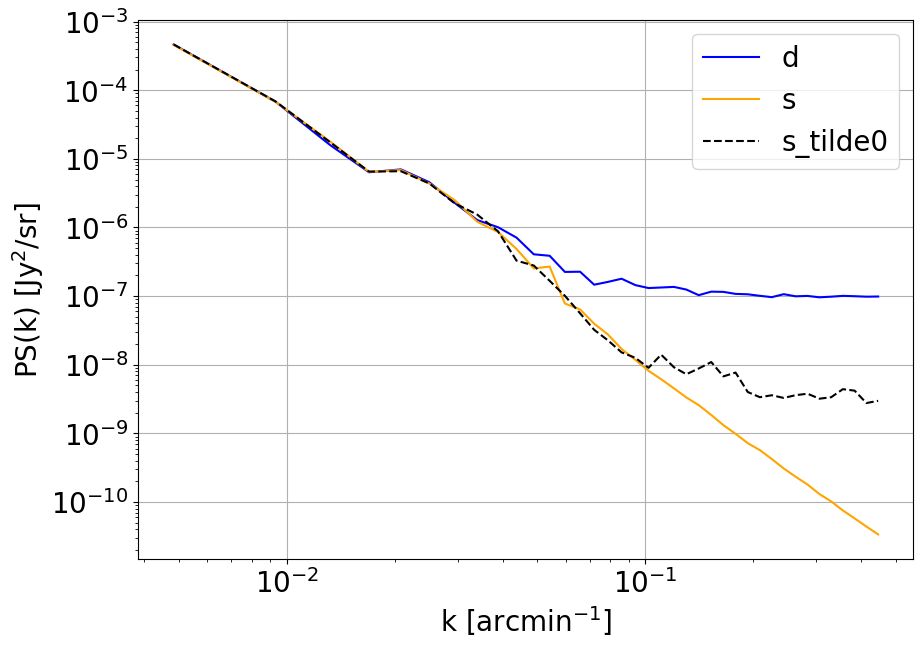

In [ ]:
plot_PS(
        np.array([d,imtot,s_tilde0]),
        labels=['d','s','s_tilde0'],
        colors=['blue','orange','black'],
        styles=['-','-','--']
        )

---------------------------------#from here we are implementing all the WPH coefficients along with S11#---------------------------------------

Starting epoch 1...
Computing loss arguments...
Real mask computed : 99 % of coeffs kept !
Imaginary mask computed : 80 % of coeffs kept !
Loss arguments computed !
Beginning optimization...
Evaluation: 0
L = 2.54748
(computed in 23.633s)

Evaluation: 5
L = 2.15077
(computed in 23.458s)

Evaluation: 10
L = 2.03732
(computed in 23.31s)

Evaluation: 15
L = 1.9064
(computed in 23.344s)

Evaluation: 20
L = 1.83015
(computed in 23.285s)

Evaluation: 25
L = 1.7654
(computed in 23.381s)

Evaluation: 30
L = 1.67151
(computed in 23.446s)

Evaluation: 35
L = 1.62954
(computed in 23.321s)

Evaluation: 40
L = 1.59531
(computed in 23.356s)

Evaluation: 45
L = 1.57072
(computed in 23.46s)

Evaluation: 50
L = 1.54891
(computed in 23.412s)

Epoch 1 done !


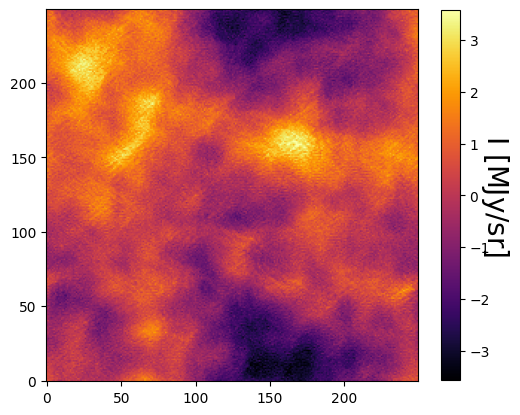

Starting epoch 2...
Computing loss arguments...
Real mask computed : 99 % of coeffs kept !
Imaginary mask computed : 80 % of coeffs kept !
Loss arguments computed !
Beginning optimization...
Evaluation: 55
L = 1.7856
(computed in 23.339s)

Evaluation: 60
L = 1.72967
(computed in 23.318s)

Evaluation: 65
L = 1.66083
(computed in 23.353s)

Evaluation: 70
L = 1.60388
(computed in 23.322s)

Evaluation: 75
L = 1.57101
(computed in 23.308s)

Evaluation: 80
L = 1.553
(computed in 23.34s)

Evaluation: 85
L = 1.53439
(computed in 23.275s)

Evaluation: 90
L = 1.52214
(computed in 23.287s)

Evaluation: 95
L = 1.50786
(computed in 23.398s)

Evaluation: 100
L = 1.49985
(computed in 23.361s)

Evaluation: 105
L = 1.49512
(computed in 23.332s)

Epoch 2 done !


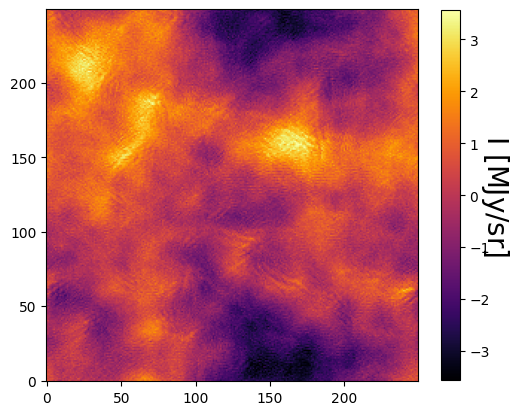

Starting epoch 3...
Computing loss arguments...
Real mask computed : 99 % of coeffs kept !
Imaginary mask computed : 80 % of coeffs kept !
Loss arguments computed !
Beginning optimization...
Evaluation: 110
L = 1.70865
(computed in 23.447s)

Evaluation: 115
L = 1.66452
(computed in 23.301s)

Evaluation: 120
L = 1.64263
(computed in 23.343s)

Evaluation: 125
L = 1.62632
(computed in 23.327s)

Evaluation: 130
L = 1.60876
(computed in 23.321s)

Evaluation: 135
L = 1.60008
(computed in 23.324s)

Evaluation: 140
L = 1.59165
(computed in 23.241s)

Evaluation: 145
L = 1.58392
(computed in 23.296s)

Evaluation: 150
L = 1.57392
(computed in 23.369s)

Evaluation: 155
L = 1.56828
(computed in 23.315s)

Evaluation: 160
L = 1.56311
(computed in 23.286s)

Epoch 3 done !


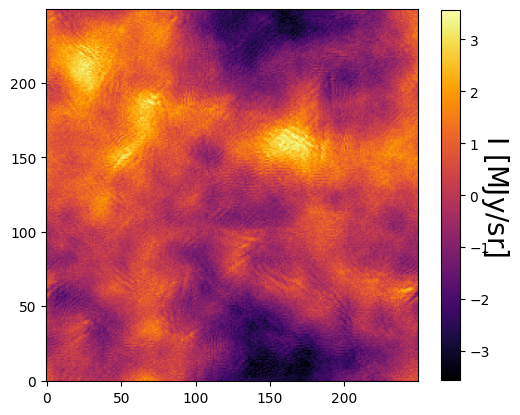

Starting epoch 4...
Computing loss arguments...
Real mask computed : 99 % of coeffs kept !
Imaginary mask computed : 80 % of coeffs kept !
Loss arguments computed !
Beginning optimization...
Evaluation: 165
L = 1.68955
(computed in 23.276s)

Evaluation: 170
L = 1.67985
(computed in 23.392s)

Evaluation: 175
L = 1.64536
(computed in 23.323s)

Evaluation: 180
L = 1.63013
(computed in 23.323s)

Evaluation: 185
L = 1.61778
(computed in 23.371s)

Evaluation: 190
L = 1.61005
(computed in 23.399s)

Evaluation: 195
L = 1.60629
(computed in 23.307s)

Evaluation: 200
L = 1.60232
(computed in 23.328s)

Evaluation: 205
L = 1.59806
(computed in 23.263s)

Evaluation: 210
L = 1.59452
(computed in 23.466s)

Evaluation: 215
L = 1.59034
(computed in 23.295s)

Epoch 4 done !


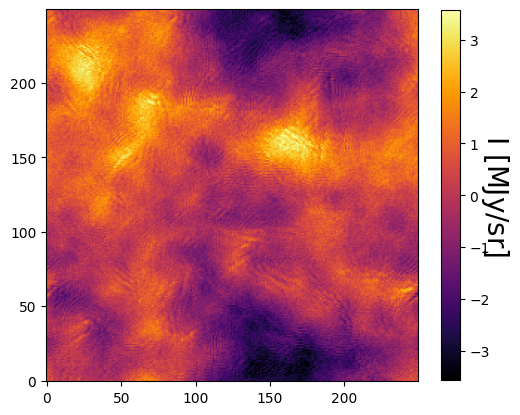

Starting epoch 5...
Computing loss arguments...
Real mask computed : 99 % of coeffs kept !
Imaginary mask computed : 80 % of coeffs kept !
Loss arguments computed !
Beginning optimization...
Evaluation: 220
L = 1.67933
(computed in 23.318s)

Evaluation: 225
L = 1.66245
(computed in 23.238s)

Evaluation: 230
L = 1.64143
(computed in 23.34s)

Evaluation: 235
L = 1.62727
(computed in 23.333s)

Evaluation: 240
L = 1.62165
(computed in 23.318s)

Evaluation: 245
L = 1.61745
(computed in 23.297s)

Evaluation: 250
L = 1.61404
(computed in 23.25s)

Evaluation: 255
L = 1.61052
(computed in 23.329s)

Evaluation: 260
L = 1.60739
(computed in 23.235s)

Evaluation: 265
L = 1.60402
(computed in 23.264s)

Evaluation: 270
L = 1.60151
(computed in 23.36s)

Epoch 5 done !


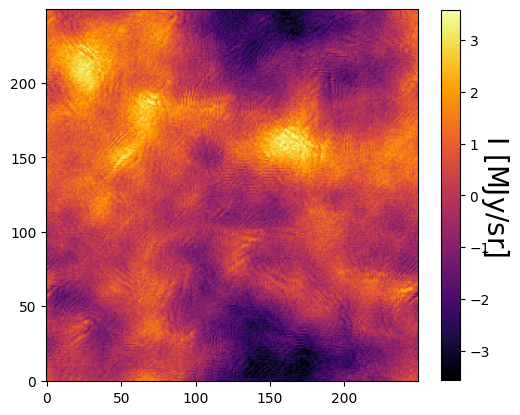

In [ ]:
# Initialization of evaluation count.
eval_cnt = 0
# Initialization of the running map s_tilde.
s_tilde = s_tilde0
# Creation of the loss list.
loss_list = []
# WPH model loading (all the WPH coefficients in the second step).
wph_op.load_model(wph_model)
# Loop of the epochs.
for i in range(n_epoch):
    print("Starting epoch "+str(i+1)+"...")
    # Bring s_tilde from array to tensor.
    s_tilde = torch.from_numpy(s_tilde).to(device)
    print('Computing loss arguments...')
    # Computation of the noise-induced bias and std on the s_tilde map.
    # The bias is only used for style='JMD', but is computed
    # in both cases (no significant additional calculations).
    bias, std = compute_bias_std(s_tilde, n_batch, wph_op, pbc, Mn, batch_number, batch_size, device)
    # Computation of the WPH statistics of "d".
    coeffs = wph_op.apply(torch.from_numpy(d).to(device), norm=None, pbc=pbc)
    if style == 'BR':
        # In BR's formalism, the target WPH coefficients are the ones of "d".
        # They are split into real and imaginary parts.
        coeffs_target = torch.cat((torch.unsqueeze(torch.real(coeffs),dim=0),
                                   torch.unsqueeze(torch.imag(coeffs),dim=0)))
    if style == 'JMD':
        # In JMD's formalism, the target WPH coefficients are computed as
        # the ones of "d" corrected from the bias estimated before.
        # They are here also split into real and imaginary parts.
        coeffs_target = torch.cat((torch.unsqueeze(torch.real(coeffs)-bias[0],dim=0),
                                   torch.unsqueeze(torch.imag(coeffs)-bias[1],dim=0)))
    # Computation of the mask for the WPH statistics threshold.
    mask = compute_mask(2, s_tilde, std, wph_op, wph_model, pbc, device)
    print('Loss arguments computed !')
    print('Beginning optimization...')
    # Beginning of the optimization.
    result = opt.minimize(objective, s_tilde.cpu().ravel(), method=method, jac=True, tol=None,
                          options={"maxiter": n_iter, "gtol": 1e-14, "ftol": 1e-14, "maxcor": 20})
    final_loss, s_tilde, niter, msg = result['fun'], result['x'], result['nit'], result['message']
    # Reshaping of the running map s_tilde.
    s_tilde = s_tilde.reshape((N, N)).astype(np.float64)
    print("Epoch "+str(i+1)+" done !")
    # Plot of the running map.
    plot(s_tilde)
    # plot_PS(
    #     np.array([d,imtot,s_tilde0, s_tilde]),
    #     labels=['d', 's', 's_tilde0(Epoch ' + str(i + 1) + ')', 's_tilde(Epoch ' + str(i + 1) + ')'],
    #     colors=['blue','orange','black','red'],
    #     styles=['-','-','--','dashdot']
    #     )




In [ ]:
np.save('separated_component.npy', s_tilde)

In [ ]:
def noise_objective(x):
    """
    Computes the loss and the corresponding gradient for c_tilde0.

    Parameters
    ----------
    x : torch 1D tensor
        Flattened running map.

    Returns
    -------
    float
        Loss value.
    torch 1D tensor
        Gradient of the loss.
    """
    global eval_cnt
    global noise_loss_list
    start_time = time.time()
    c = x.reshape((N, N))  # Reshape x
    c = torch.from_numpy(c).to(device).requires_grad_(True)  # Track operations on c
    # Convert d and s_tilde0 to PyTorch tensors before the operation
    d_tensor = torch.from_numpy(d).to(device)
    s_tilde0_tensor = torch.from_numpy(s_tilde0).to(device)
    # Compute the loss as the difference between d and (s_tilde0 + c)
    L = torch.norm(d_tensor - (s_tilde0_tensor + c))**2  #for BR formalism
    L.backward()  # Compute the gradient
    c_grad = c.grad.cpu().numpy().astype(x.dtype)  # Get the gradient
    if eval_cnt % 5 == 0:
        print(f"Evaluation: {eval_cnt}")
        print("L = " + str(round(L.item(), 5)))
        print("(computed in " + str(round(time.time() - start_time, 3)) + "s)")
        print("")
    eval_cnt += 1
    noise_loss_list.append(L.item())
    return L.item(), c_grad.ravel()




In [ ]:
def noise_objective(x):
    global eval_cnt
    global noise_loss_list
    start_time = time.time()
    c = x.reshape((N, N))  # Reshape x
    c = torch.from_numpy(c).to(device).requires_grad_(True)  # Track operations on c
    # Convert d and s_tilde0 to PyTorch tensors before the operation
    d_tensor = torch.from_numpy(d).to(device)
    s_tilde0_tensor = torch.from_numpy(s_tilde0).to(device)
    # Compute the loss as the difference between d and (s_tilde0 + c)
    L = torch.norm(d_tensor - (s_tilde0_tensor + c))**2
    L.backward()  # Compute the gradient
    c_grad = c.grad.cpu().numpy().astype(x.dtype)  # Get the gradient
    if eval_cnt % 5 == 0:
        print(f"Evaluation: {eval_cnt}")
        print("L = " + str(round(L.item(), 5)))
        print("(computed in " + str(round(time.time() - start_time, 3)) + "s)")
        print("")
    eval_cnt += 1
    noise_loss_list.append(L.item())
    return L.item(), c_grad.ravel()

Starting epoch 1...
Beginning optimization...
Evaluation: 0
L = 0.0
(computed in 0.002s)

Epoch 1 done !


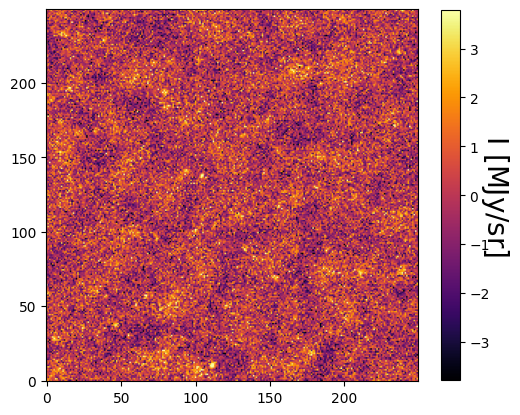

Starting epoch 2...
Beginning optimization...
Epoch 2 done !


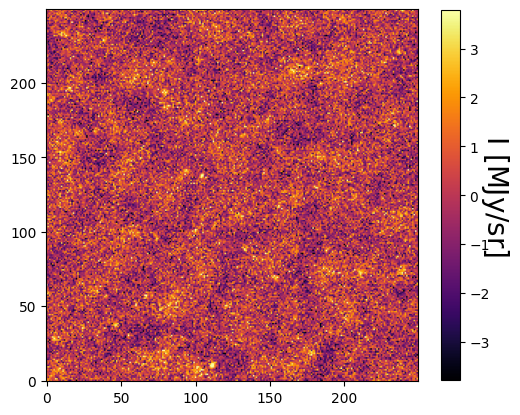

Starting epoch 3...
Beginning optimization...
Epoch 3 done !


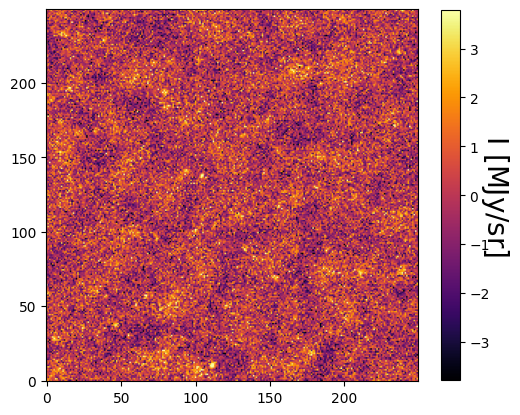

Starting epoch 4...
Beginning optimization...
Epoch 4 done !


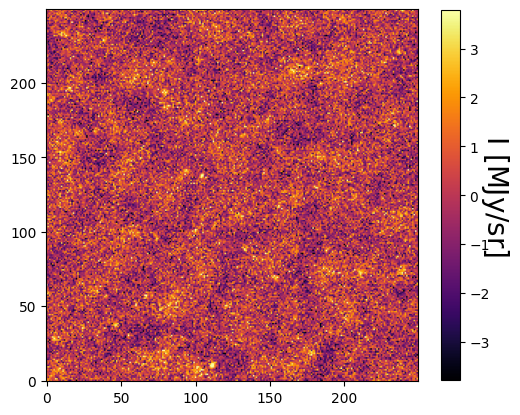

Starting epoch 5...
Beginning optimization...
Epoch 5 done !


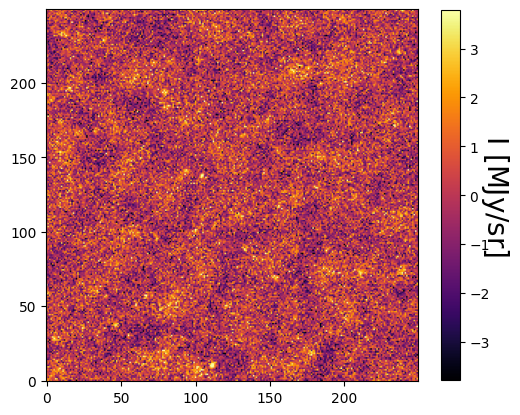

In [ ]:
# Initialize c_tilde0
c_tilde0 = d - s_tilde0

# Optimization parameters
n_epoch = 5
n_iter = 80
method = 'L-BFGS-B'

# Initialize evaluation count and loss list
eval_cnt = 0
noise_loss_list = []

# Loop of the epochs
for i in range(n_epoch):
    print("Starting epoch " + str(i + 1) + "...")
    # Bring c_tilde0 from array to tensor
    c_tilde0 = torch.from_numpy(c_tilde0).to(device)
    print('Beginning optimization...')
    # Beginning of the optimization
    result = opt.minimize(noise_objective, c_tilde0.cpu().ravel(), method=method, jac=True, tol=None,
                          options={"maxiter": n_iter, "gtol": 1e-14, "ftol": 1e-14, "maxcor": 20})
    final_loss, c_tilde0, niter, msg = result['fun'], result['x'], result['nit'], result['message']
    # Reshaping of the running map c_tilde0
    c_tilde0 = c_tilde0.reshape((N, N)).astype(np.float64)
    print("Epoch " + str(i + 1) + " done !")
    # Plot of the running map
    plot(c_tilde0)



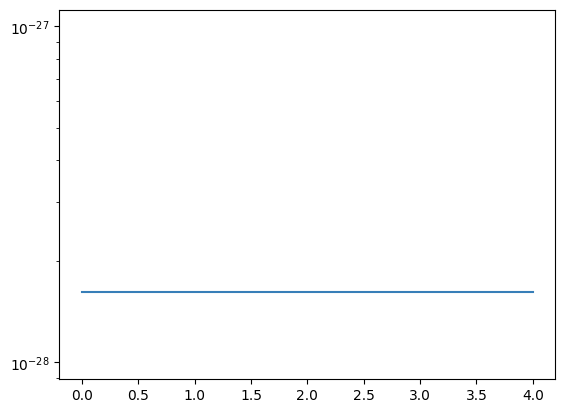

In [ ]:
# Plot the loss values
plt.figure()
plt.plot(noise_loss_list)
plt.yscale('log')
plt.show()

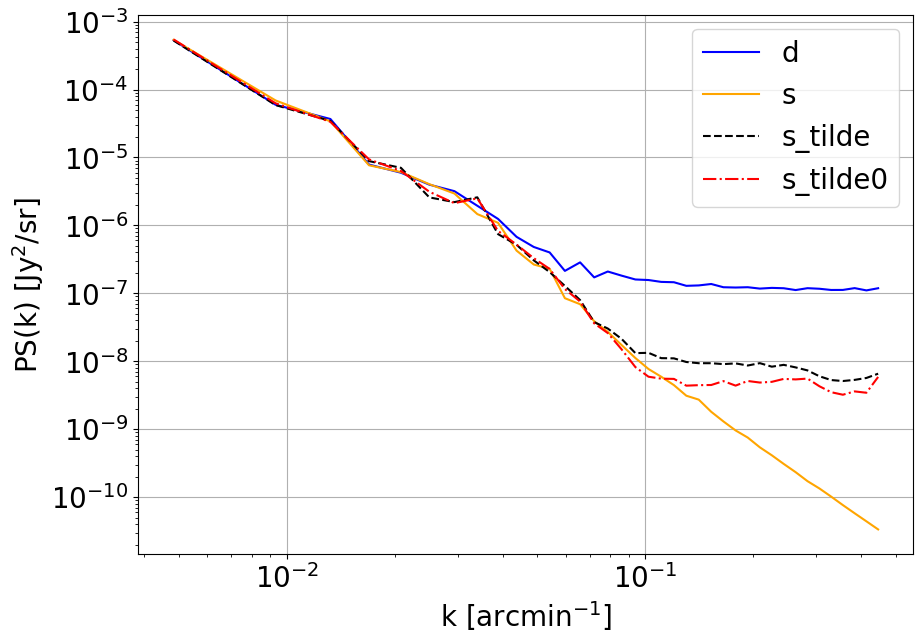

In [ ]:
 plot_PS(
        np.array([d,imtot,s_tilde, s_tilde0]),
        labels=['d','s','s_tilde','s_tilde0'],
        colors=['blue','orange','black','red'],
        styles=['-','-','--','dashdot']
        )

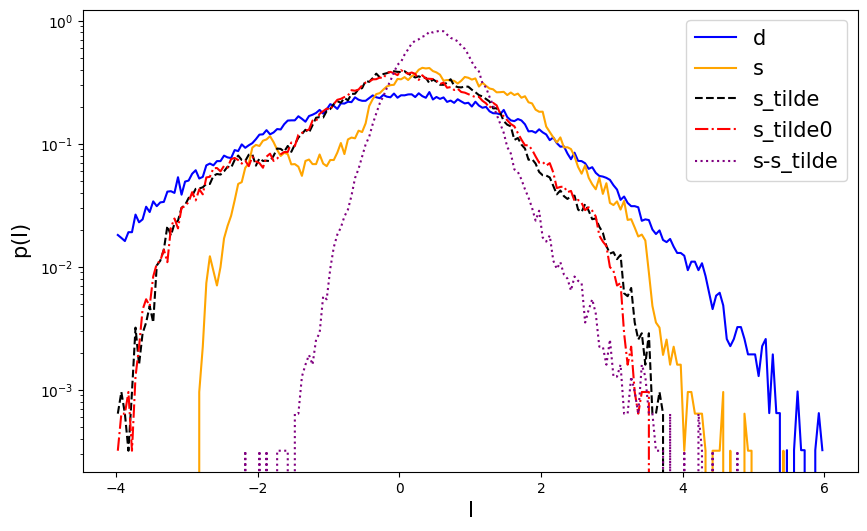

In [ ]:
from CompSep.Library.tools import plot_hist
#color = ['blue', 'orange', 'black']
nature = r'$\rm{I}$'
#plot_hist(np.array([d,s,s_tilde]),labels=[r"$\rm{d}$",r"$\rm{s}$",r"$\rm{\tilde{s}}$"],colors=[color[0],color[1],color[1]],styles=['-','-','--'],n_bins=200,log=True,value_range=(-1,4),fontsize=15,nature=nature)
plot_hist(np.array([d,imtot2,s_tilde, s_tilde0, imtot2-s_tilde]),
        labels=['d','s','s_tilde', 's_tilde0', 's-s_tilde'],
        colors=['blue','orange','black','red','purple'],
        styles=['-','-','--','dashdot', 'dotted'],n_bins=200,value_range=(-4,6),log=True)

##In this section, instead of using either one of the formalism, we are going to implement both BR and JMD alternatively and analyze the result
(discuss the accuracy as for BR we are considering the mock map as it is but while taking JMD, we are debiasing the mock map and then implementing it)

In [ ]:
# Initialization of evaluation count.(L-BFGS-B method)
eval_cnt = 0
# Initialization of the running map s_tilde0.
s_tilde0 = d
# Creation of the loss list.
loss_list = []
# WPH model loading (only the power-spectrum-like coefficients in the first step).
wph_op.load_model(["S11"])

styles = ['JMD', 'BR']  # Define the styles

# Loop of the epochs.
for i in range(n_epoch):
    style = styles[i % 2]  # Alternate between JMD and BR
    print(f"Starting epoch {i+1} with style: {style}...")

    # Bring s_tilde0 from array to tensor.
    s_tilde0 = torch.from_numpy(s_tilde0).to(device)
    print('Computing loss arguments...')

    # Computation of the noise-induced bias and std on the s_tilde0 map.
    bias, std = compute_bias_std(s_tilde0, n_batch, wph_op, pbc, Mn, batch_number, batch_size, device)

    # Computation of the WPH statistics of "d".
    coeffs = wph_op.apply(torch.from_numpy(d).to(device), norm=None, pbc=pbc)

    if style == 'BR':
        # In BR's formalism, the target WPH coefficients are the ones of "d".
        coeffs_target = torch.cat((torch.unsqueeze(torch.real(coeffs), dim=0),
                                   torch.unsqueeze(torch.imag(coeffs), dim=0)))
    elif style == 'JMD':
        # In JMD's formalism, the target WPH coefficients are computed as
        # the ones of "d" corrected from the bias estimated before.
        coeffs_target = torch.cat((torch.unsqueeze(torch.real(coeffs) - bias[0], dim=0),
                                   torch.unsqueeze(torch.imag(coeffs) - bias[1], dim=0)))

    # Computation of the mask for the WPH statistics threshold.
    mask = compute_mask(1, s_tilde0, std, wph_op, wph_model, pbc, device)

    print('Loss arguments computed !')
    print('Beginning optimization...')

    # Beginning of the optimization.
    result = opt.minimize(objective, s_tilde0.cpu().ravel(), method=method, jac=True, tol=None,
                          options={"maxiter": n_iter, "gtol": 1e-14, "ftol": 1e-14, "maxcor": 20})
    final_loss, s_tilde0, niter, msg = result['fun'], result['x'], result['nit'], result['message']

    # Reshaping of the running map s_tilde0.
    s_tilde0 = s_tilde0.reshape((N, N)).astype(np.float64)
    print(f"Epoch {i+1} done with style: {style} !")

Starting epoch 1 with style: JMD...
Computing loss arguments...
Real mask computed : 100 % of coeffs kept !
Imaginary mask computed : 95 % of coeffs kept !
Loss arguments computed !
Beginning optimization...
Evaluation: 0
L = 109.14658
(computed in 0.043s)

Evaluation: 5
L = 13.19078
(computed in 0.05s)

Evaluation: 10
L = 0.3
(computed in 0.052s)

Evaluation: 15
L = 0.19594
(computed in 0.051s)

Evaluation: 20
L = 0.15624
(computed in 0.05s)

Evaluation: 25
L = 0.12459
(computed in 0.049s)

Evaluation: 30
L = 0.11206
(computed in 0.064s)

Evaluation: 35
L = 0.11556
(computed in 0.051s)

Evaluation: 40
L = 0.09982
(computed in 0.051s)

Evaluation: 45
L = 0.09445
(computed in 0.05s)

Evaluation: 50
L = 0.09086
(computed in 0.053s)

Evaluation: 55
L = 0.08832
(computed in 0.05s)

Epoch 1 done with style: JMD !
Starting epoch 2 with style: BR...
Computing loss arguments...
Real mask computed : 100 % of coeffs kept !
Imaginary mask computed : 95 % of coeffs kept !
Loss arguments computed !

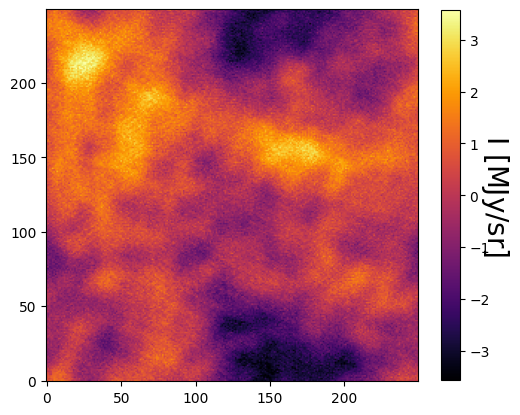

In [ ]:
plot(s_tilde0)

Starting epoch 1 with style: JMD
Computing loss arguments...
Real mask computed : 99 % of coeffs kept !
Imaginary mask computed : 80 % of coeffs kept !
Loss arguments computed !
Beginning optimization...
Evaluation: 0
L = 1.3366
(computed in 0.392s)

Evaluation: 5
L = 0.72087
(computed in 0.398s)

Evaluation: 10
L = 0.51261
(computed in 0.413s)

Evaluation: 15
L = 0.40326
(computed in 0.41s)

Evaluation: 20
L = 0.3363
(computed in 0.402s)

Evaluation: 25
L = 0.30072
(computed in 0.404s)

Evaluation: 30
L = 0.27437
(computed in 0.403s)

Evaluation: 35
L = 0.26229
(computed in 0.399s)

Evaluation: 40
L = 0.24793
(computed in 0.407s)

Evaluation: 45
L = 0.23687
(computed in 0.418s)

Evaluation: 50
L = 0.2284
(computed in 0.395s)

Epoch 1 done with style: JMD !


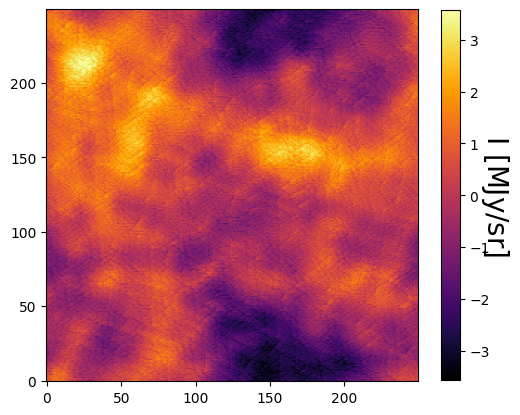

Starting epoch 2 with style: BR
Computing loss arguments...
Real mask computed : 99 % of coeffs kept !
Imaginary mask computed : 80 % of coeffs kept !
Loss arguments computed !
Beginning optimization...
Evaluation: 55
L = 1.4854
(computed in 23.358s)

Evaluation: 60
L = 1.19607
(computed in 23.284s)

Evaluation: 65
L = 1.08026
(computed in 23.336s)

Evaluation: 70
L = 1.01822
(computed in 23.364s)

Evaluation: 75
L = 0.98095
(computed in 23.283s)

Evaluation: 80
L = 0.96202
(computed in 23.31s)

Evaluation: 85
L = 0.95373
(computed in 23.247s)

Evaluation: 90
L = 0.94513
(computed in 23.377s)



In [ ]:
# Initialization of evaluation count.
eval_cnt = 0
# Initialization of the running map s_tilde.
s_tilde = s_tilde0
# Creation of the loss list.
loss_list = []
# WPH model loading (all the WPH coefficients in the second step).
wph_op.load_model(wph_model)
# Loop of the epochs.

styles = ['JMD', 'BR'] # Define the styles

for i in range(n_epoch):
    style = styles[i % 2]  # Alternate between JMD and BR
    print(f"Starting epoch {i+1} with style: {style}")

    # Bring s_tilde from array to tensor.
    s_tilde = torch.from_numpy(s_tilde).to(device)
    print('Computing loss arguments...')

    # Computation of the noise-induced bias and std on the s_tilde map.
    bias, std = compute_bias_std(s_tilde, n_batch, wph_op, pbc, Mn, batch_number, batch_size, device)

    # Computation of the WPH statistics of "d".
    coeffs = wph_op.apply(torch.from_numpy(d).to(device), norm=None, pbc=pbc)

    if style == 'BR':
        # In BR's formalism, the target WPH coefficients are the ones of "d".
        coeffs_target = torch.cat((torch.unsqueeze(torch.real(coeffs),dim=0),
                                   torch.unsqueeze(torch.imag(coeffs),dim=0)))
    elif style == 'JMD':
        # In JMD's formalism, the target WPH coefficients are computed as
        # the ones of "d" corrected from the bias estimated before.
        coeffs_target = torch.cat((torch.unsqueeze(torch.real(coeffs)-bias[0],dim=0),
                                   torch.unsqueeze(torch.imag(coeffs)-bias[1],dim=0)))

    # Computation of the mask for the WPH statistics threshold.
    mask = compute_mask(2, s_tilde, std, wph_op, wph_model, pbc, device)

    print('Loss arguments computed !')
    print('Beginning optimization...')

    # Beginning of the optimization.
    result = opt.minimize(objective, s_tilde.cpu().ravel(), method=method, jac=True, tol=None,
                          options={"maxiter": n_iter, "gtol": 1e-14, "ftol": 1e-14, "maxcor": 20})
    final_loss, s_tilde, niter, msg = result['fun'], result['x'], result['nit'], result['message']

    # Reshaping of the running map s_tilde.
    s_tilde = s_tilde.reshape((N, N)).astype(np.float64)
    print(f"Epoch {i+1} done with style: {style} !")
    plot(s_tilde)



Text(0.5, 1.0, 'comp separation using both BR and JMD formalism alternatively (epoch=4)')

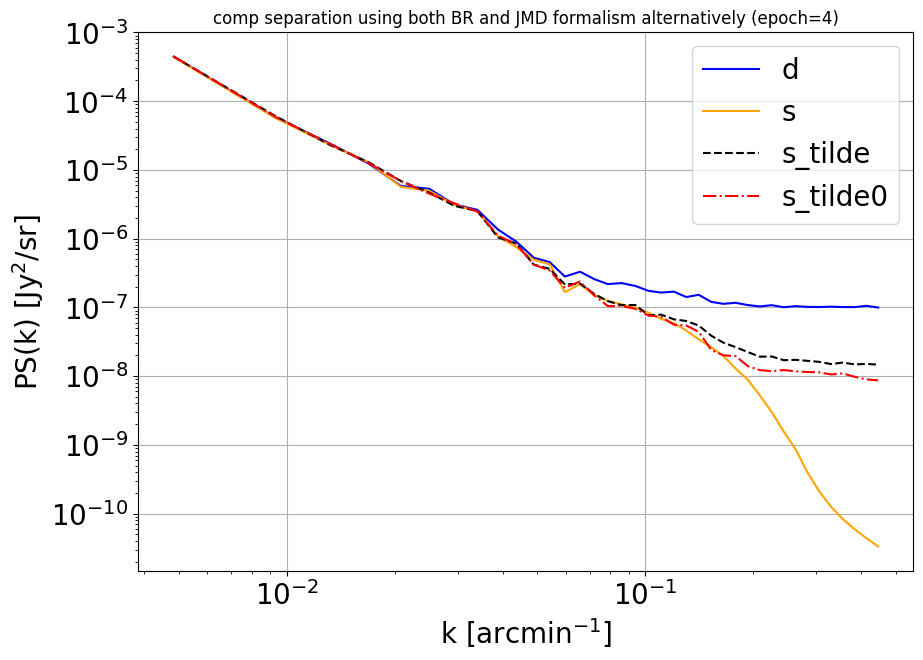

In [ ]:
plot_PS(
        np.array([d,imtot2,s_tilde, s_tilde0]),
        labels=['d','s','s_tilde','s_tilde0'],
        colors=['blue','orange','black','red'],
        styles=['-','-','--','dashdot']
        )

plt.title("comp separation using both BR and JMD formalism alternatively (epoch=4)")

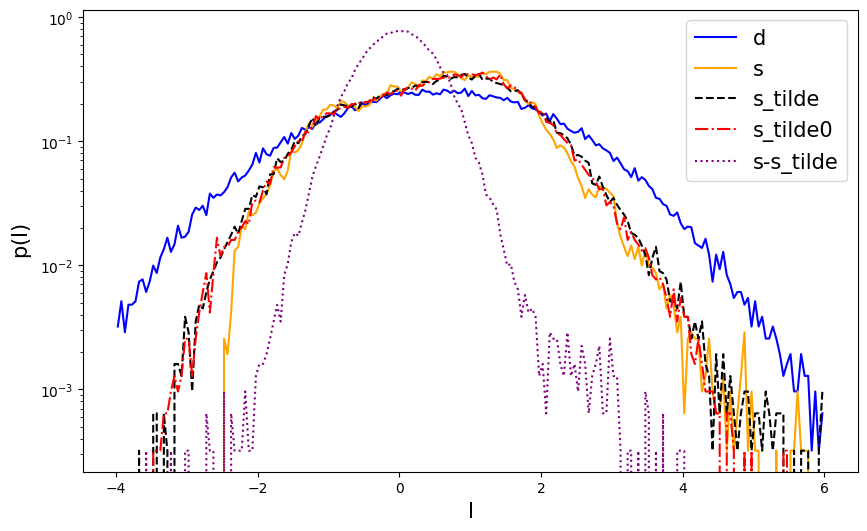

In [ ]:
from CompSep.Library.tools import plot_hist
#color = ['blue', 'orange', 'black']
nature = r'$\rm{I}$'
plot_hist(np.array([d,imtot2,s_tilde, s_tilde0, imtot2-s_tilde]),
        labels=['d','s','s_tilde', 's_tilde0', 's-s_tilde'],
        colors=['blue','orange','black','red','purple'],
        styles=['-','-','--','dashdot', 'dotted'],n_bins=200,value_range=(-4,6),log=True)




---



Starting epoch 1...
Iteration 0: Loss = 1.807526660301225e-28 (computed in 0.007s)
Iteration 5: Loss = 0.0018777041192680765 (computed in 0.006s)
Iteration 10: Loss = 0.0014407819634726445 (computed in 0.005s)
Iteration 15: Loss = 0.0007980820241082484 (computed in 0.005s)
Iteration 20: Loss = 0.0004533285008269879 (computed in 0.005s)
Iteration 25: Loss = 0.00025228047335331164 (computed in 0.005s)
Iteration 30: Loss = 0.00012709428939771625 (computed in 0.005s)
Iteration 35: Loss = 4.978087826554085e-05 (computed in 0.005s)
Iteration 40: Loss = 9.775891680507433e-06 (computed in 0.005s)
Iteration 45: Loss = 2.1933599230790267e-07 (computed in 0.005s)
Epoch 1 done!
Starting epoch 2...
Iteration 0: Loss = 7.5673220445259874e-06 (computed in 0.004s)
Iteration 5: Loss = 1.3070846054084928e-05 (computed in 0.003s)
Iteration 10: Loss = 7.989891738900948e-06 (computed in 0.003s)
Iteration 15: Loss = 9.612314265704092e-07 (computed in 0.003s)
Iteration 20: Loss = 6.397019832819533e-07 (compu

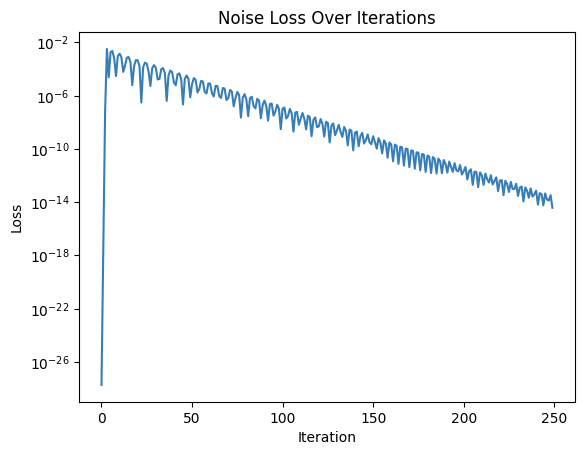

In [ ]:
import numpy as np
import torch
import torch.optim as optim
import matplotlib.pyplot as plt
import time

# Define the loss function for c_tilde0
def noise_loss_function(c_tilde0, s_tilde0, d):
    """
    Computes the loss for c_tilde0.

    Parameters
    ----------
    c_tilde0 : torch.Tensor
        Estimated noise component.
    s_tilde0 : torch.Tensor
        Estimated signal component.
    d : torch.Tensor
        Noisy data.

    Returns
    -------
    torch.Tensor
        Loss value.
    """
    d_tensor = torch.from_numpy(d).to(c_tilde0.device) # Move d to the same device as c_tilde0
    s_tilde0_tensor = torch.from_numpy(s_tilde0).to(c_tilde0.device) # Move s_tilde0 to the same device as c_tilde0

    return torch.norm(d_tensor - (s_tilde0_tensor + c_tilde0))**2
    # return torch.norm(d - (s_tilde0 + c_tilde0))**2

# Initialize c_tilde0
c_tilde0 = d - s_tilde0
c_tilde0 = torch.from_numpy(c_tilde0).to(device).requires_grad_(True)

# Optimization parameters
n_epoch = 5
n_iter = 50
learning_rate = 1e-3

# Initialize optimizer
optimizer = optim.Adam([c_tilde0], lr=learning_rate)

# Initialize loss list
noise_loss_list = []

# Loop of the epochs
for epoch in range(n_epoch):
    print(f"Starting epoch {epoch + 1}...")
    for iter in range(n_iter):
        start_time = time.time()

        # Zero the gradients
        optimizer.zero_grad()

        # Compute the loss
        loss = noise_loss_function(c_tilde0, s_tilde0, d)

        # Backpropagate the loss
        loss.backward()

        # Update the parameters
        optimizer.step()

        # Record the loss
        noise_loss_list.append(loss.item())

        if iter % 5 == 0:
            print(f"Iteration {iter}: Loss = {loss.item()} (computed in {round(time.time() - start_time, 3)}s)")

    print(f"Epoch {epoch + 1} done!")

# Plot the loss values
plt.figure()
plt.plot(noise_loss_list)
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Noise Loss Over Iterations')
plt.show()

In [ ]:
optimized_c_tilde0 = c_tilde0.detach().cpu().numpy()

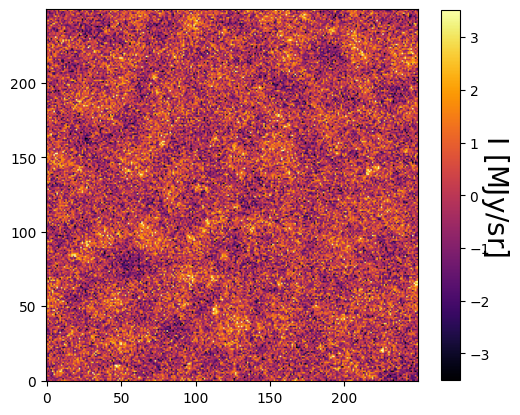

In [ ]:
plot(optimized_c_tilde0)

In [ ]:
s_tilde0_up = np.load('/content/separated_component_stilde0.npy')
d_up = np.load('/content/d.npy')